## **SETUP**

In [11]:
import os
import sys

In [12]:
pwd

'/content/drive/MyDrive/16823 - Physics-Based Methods in Vision/all_fruits/fruit'

In [13]:
cd /content/drive/MyDrive/16823 - Physics-Based Methods in Vision/all_fruits

/content/drive/MyDrive/16823 - Physics-Based Methods in Vision/all_fruits


In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

In [15]:
# !unzip fruit.zip

In [16]:
ls

 fruit/   fruit.zip  'iCloud Photos from Minh Tran'/


In [17]:
cd fruit

/content/drive/MyDrive/16823 - Physics-Based Methods in Vision/all_fruits/fruit


In [18]:
ls

best_model_aug_focal_polarized_weights.pth             d2.csv
best_model_aug_focal_structured_polarized_weights.pth  d2.csv.gsheet
best_model_aug_focal_structured_weights.pth            d3/
best_model_aug_focal_weights.pth                       d3.csv
best_model_aug_weights.pth                             d3.csv.gsheet
best_model_weights.pth                                 d4/
d1/                                                    d4.csv
d1.csv                                                 d4.csv.gsheet
d1.csv.gsheet                                          sample/
d2/


In [19]:
# Light encode 0: 'light' 1: 'light_polarized' 2: 'polarized'
# Fruit encode
# Label encode 0: 1: 2:

In [54]:
device = 'cuda'

In [20]:
d1 = pd.read_csv('d1.csv')
d1.head()

,imgID,fruitType,imageType,fruitLabel
0,3540,strawberry,0,0
1,3541,strawberry,0,0
2,3542,strawberry,0,0
3,3543,strawberry,0,0
4,3544,strawberry,0,0


## **GET DATA**

In [21]:
import os
import csv
import pandas as pd

def read_csv_data(csv_file_path, day):
    data = pd.read_csv(csv_file_path)
    data['day'] = day
    return data

def select_images_v4(base_path, days=None, fruit_types=None, image_types=None, fruit_labels=None):
    if days is None:
        days = ['d1', 'd2', 'd3', 'd4']
    
    all_data = pd.DataFrame()
    
    # Read CSV files and concatenate the data
    for day in days:
        csv_file_path = os.path.join(base_path, f"{day}.csv")
        if os.path.exists(csv_file_path):
            day_data = read_csv_data(csv_file_path, day)
            all_data = pd.concat([all_data, day_data], ignore_index=True)

    # Filter the data based on the given criteria
    if fruit_types is not None:
        all_data = all_data[all_data['fruitType'].isin(fruit_types)]

    if image_types is not None:
        all_data = all_data[all_data['imageType'].isin(image_types)]

    if fruit_labels is not None:
        all_data = all_data[all_data['fruitLabel'].isin(fruit_labels)]

    return all_data


In [22]:
if __name__ == '__main__':
    base_path = './'

    # Example usage:
    # Get table data for days 1 and 2 with fruit type "Strawberries" and image type "0"
    filtered_data = select_images_v4(base_path, days=['d1', 'd2', 'd3', 'd4'], fruit_types=['strawberry'], image_types=[0])

    # Print filtered data
    print(filtered_data)

     imgID   fruitType  imageType  fruitLabel day
0     3540  strawberry          0           0  d1
1     3541  strawberry          0           0  d1
2     3542  strawberry          0           0  d1
3     3543  strawberry          0           0  d1
4     3544  strawberry          0           0  d1
5     3545  strawberry          0           0  d1
6     3546  strawberry          0           0  d1
7     3547  strawberry          0           0  d1
8     3548  strawberry          0           0  d1
9     3549  strawberry          0           0  d1
210   3866  strawberry          0           1  d2
211   3867  strawberry          0           0  d2
212   3868  strawberry          0           0  d2
213   3869  strawberry          0           0  d2
214   3870  strawberry          0           1  d2
215   3871  strawberry          0           1  d2
216   3872  strawberry          0           0  d2
217   3873  strawberry          0           0  d2
218   3874  strawberry          0           0  d2


In [23]:
all_data = select_images_v4(base_path, days=None, fruit_types=None, image_types=None, fruit_labels=None)

In [24]:
len(all_data)

840

In [25]:
all_data.fruitLabel.describe()

count    840.000000
mean       0.459524
std        0.714755
min        0.000000
25%        0.000000
50%        0.000000
75%        1.000000
max        2.000000
Name: fruitLabel, dtype: float64

## **DATA EXPLORATION**

In [34]:
import plotly.graph_objects as go

# Sample data
data = {
    'Strawberries': [16, 5, 19],
    'Tomatoes': [39, 1, 0],
    'Raspberry': [20, 12, 8],
    'Green Grapes': [31, 9, 0],
    'Blueberries': [27, 12, 1],
    'Seedless Grapes': [26, 11, 3],
    'Weird Blueberries': [22, 14, 4],
}

# Normalize the data
normalized_data = {}
for fruit, values in data.items():
    total = sum(values)
    normalized_values = [40 * v / total for v in values]
    normalized_data[fruit] = normalized_values

label_classes = ['Yes', 'So so', 'No']

fig = go.Figure()

for i, label_class in enumerate(label_classes):
    fig.add_trace(go.Bar(
        x=list(normalized_data.keys()),
        y=[category_data[i] for category_data in normalized_data.values()],
        name=label_class,
    ))

fig.update_layout(
    barmode='group',
    title='Label Distributions of 7 Fruits Classes',
    xaxis_title='Categories',
    yaxis_title='Values',
    legend_title='Label Classes',
)

fig.show()


In [35]:
import math

# Define a function to visualize images based on criteria
def visualize_images(data, fruitType=None, imageType=None, fruitLabel=None, day=None, base_path='./'):
    # Define a mapping from imageType to folder name
    image_type_folder = {0: "light", 1: "light_polarized", 2: "polarized"}
    
    # Filter the data based on the criteria
    filtered_data = data
    if fruitType is not None:
        filtered_data = filtered_data[filtered_data['fruitType'] == fruitType]
    if imageType is not None:
        filtered_data = filtered_data[filtered_data['imageType'] == imageType]
    if fruitLabel is not None:
        filtered_data = filtered_data[filtered_data['fruitLabel'] == fruitLabel]
    if day is not None:
        filtered_data = filtered_data[filtered_data['day'] == day]
    
    # Check if filtered data is empty
    if len(filtered_data) == 0:
        print("No images match the specified criteria.")
        return

    # Display the selected images
    num_images = len(filtered_data)
    fig, axs = plt.subplots(1, len(filtered_data),  figsize=(5 * num_images, 5))
    for i, row in filtered_data.iterrows():
        img_path = os.path.join(base_path, row['day'], image_type_folder[row['imageType']], f'IMG_{row["imgID"]}.JPG')
        img = Image.open(img_path)
        axs[i].imshow(img)
        axs[i].axis('off')
        axs[i].set_title(f'Fruit: {row["fruitType"]}\nImage Type: {image_type_folder[row["imageType"]]}\nLabel: {row["fruitLabel"]}\nDay: {row["day"]}',
                         fontsize=10)
    plt.show()

# Define a function to visualize images based on criteria
def visualize_images_v2(data, fruitTypes=None, imageTypes=None, fruitLabels=None, days=None, max_images=None, base_path='./'):
    # Define a mapping from imageType to folder name
    image_type_folder = {0: "light", 1: "light_polarized", 2: "polarized"}
    
    # Filter the data based on the criteria
    if fruitTypes is not None:
        filtered_data = data[data['fruitType'].isin(fruitTypes)]
    if imageTypes is not None:
        filtered_data = filtered_data[filtered_data['imageType'].isin(imageTypes)]
    if fruitLabels is not None:
        filtered_data = filtered_data[filtered_data['fruitLabel'].isin(fruitLabels)]
    if days is not None:
        filtered_data = filtered_data[filtered_data['day'].isin(days)]
    
    # Check if filtered data is empty
    if len(filtered_data) == 0:
        print("No images match the specified criteria.")
        return
    
    # Limit the number of images to display if max_images is set
    if max_images is not None:
        # Calculate the number of images per fruit type
        num_per_fruit = math.ceil(max_images / len(fruitTypes))
        # Select the first num_per_fruit images for each fruit type
        filtered_data = filtered_data.groupby('fruitType').apply(lambda x: x.head(num_per_fruit)).reset_index(drop=True)
    
    # Display the selected images
    num_images = len(filtered_data)
    fig, axs = plt.subplots(1, num_images, figsize=(5 * num_images, 5))  # Adjust figsize to increase image size
    for i, row in filtered_data.iterrows():
        img_path = os.path.join(base_path, row['day'], image_type_folder[row['imageType']], f'IMG_{row["imgID"]}.JPG')
        img = Image.open(img_path)
        axs[i].imshow(img)
        axs[i].axis('off')
        axs[i].set_title(f'Fruit: {row["fruitType"]}\nImage Type: {image_type_folder[row["imageType"]]}\nLabel: {row["fruitLabel"]}\nDay: {row["day"]}',
                         fontsize=10)  # Adjust fontsize to decrease title size
    plt.show()


# Define a function to visualize images based on criteria
def visualize_images_v3(data, fruitTypes=None, imageTypes=None, fruitLabels=None, days=None, max_images=None, base_path='./'):
    # Define a mapping from imageType to folder name
    image_type_folder = {0: "light", 1: "light_polarized", 2: "polarized"}
    
    # Filter the data based on the criteria
    if fruitTypes is not None:
        filtered_data = data[data['fruitType'].isin(fruitTypes)]
    if imageTypes is not None:
        filtered_data = filtered_data[filtered_data['imageType'].isin(imageTypes)]
    if fruitLabels is not None:
        filtered_data = filtered_data[filtered_data['fruitLabel'].isin(fruitLabels)]
    if days is not None:
        filtered_data = filtered_data[filtered_data['day'].isin(days)]
    
    # Check if filtered data is empty
    if len(filtered_data) == 0:
        print("No images match the specified criteria.")
        return
    
    # Get unique fruit types and image types
    unique_fruit_types = filtered_data['fruitType'].unique()
    unique_image_types = filtered_data['imageType'].unique()
    
    # Create a grid of subplots
    fig, axs = plt.subplots(len(unique_fruit_types), len(unique_image_types), figsize=(5 * len(unique_image_types), 5 * len(unique_fruit_types)))
    
    # Display the images in the grid
    for i, fruit_type in enumerate(unique_fruit_types):
        for j, image_type in enumerate(unique_image_types):
            # Get the first image that matches the current fruit type and image type
            img_row = filtered_data[(filtered_data['fruitType'] == fruit_type) & (filtered_data['imageType'] == image_type)].iloc[0]
            img_path = os.path.join(base_path, img_row['day'], image_type_folder[img_row['imageType']], f'IMG_{img_row["imgID"]}.JPG')
            img = Image.open(img_path)
            axs[i, j].imshow(img)
            axs[i, j].axis('off')
            axs[i, j].set_title(f'Fruit: {img_row["fruitType"]}\nImage Type: {image_type_folder[img_row["imageType"]]}\nLabel: {img_row["fruitLabel"]}\nDay: {img_row["day"]}',
                                fontsize=10)
    plt.tight_layout()
    plt.show()



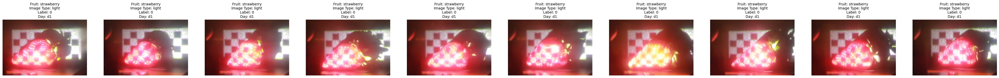

In [36]:
# Visualize images with fruitType='strawberry', imageType=0, fruitLabel=1, day='d1'
visualize_images(all_data, fruitType='strawberry', imageType=0, fruitLabel=0, day='d1', base_path='./')

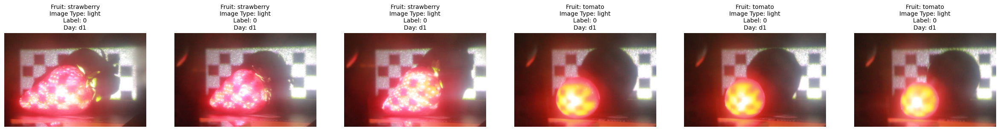

In [37]:
# Visualize images with fruitTypes=['strawberry', 'tomato'], imageTypes=[0, 1], fruitLabels=[1, 2], days=['d1', 'd2'], max_images=6
visualize_images_v2(all_data, fruitTypes=['strawberry', 'tomato'], imageTypes=[0, 1, 2], fruitLabels=[0], days=['d1'], max_images=6, base_path='./')

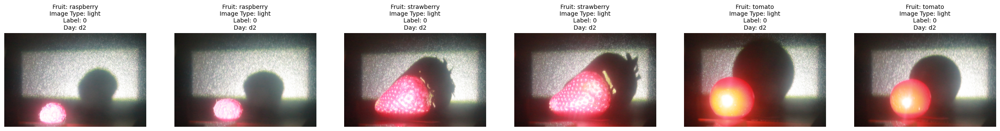

In [38]:
visualize_images_v2(all_data, fruitTypes=['strawberry', 'tomato', 'raspberry'], imageTypes=[0], fruitLabels=[0], days=['d2'], max_images=6, base_path='./')

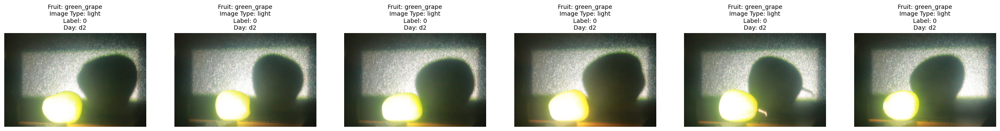

In [39]:
visualize_images_v2(all_data, fruitTypes=['green_grape'], imageTypes=[0], fruitLabels=[0], days=['d2'], max_images=6, base_path='./')

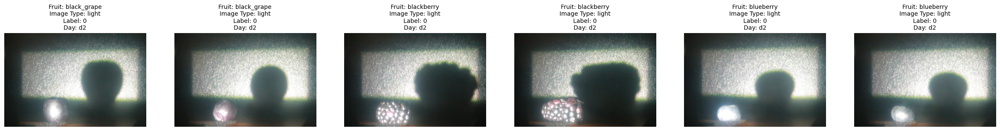

In [40]:
visualize_images_v2(all_data, fruitTypes=['blueberry', 'black_grape', 'blackberry'], imageTypes=[0], fruitLabels=[0], days=['d2'], max_images=6, base_path='./')

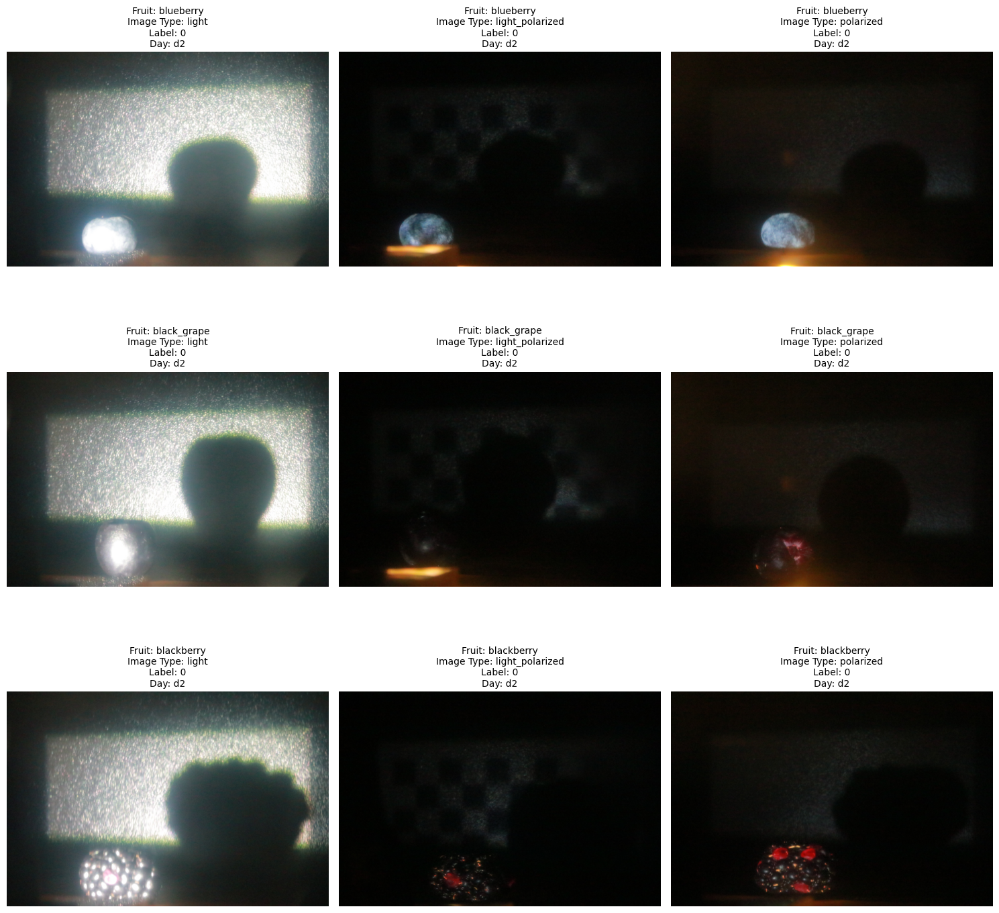

In [41]:
visualize_images_v3(all_data, fruitTypes=['blueberry', 'black_grape', 'blackberry'], imageTypes=[0, 1, 2], fruitLabels=[0], days=['d2'], max_images=9, base_path='./')

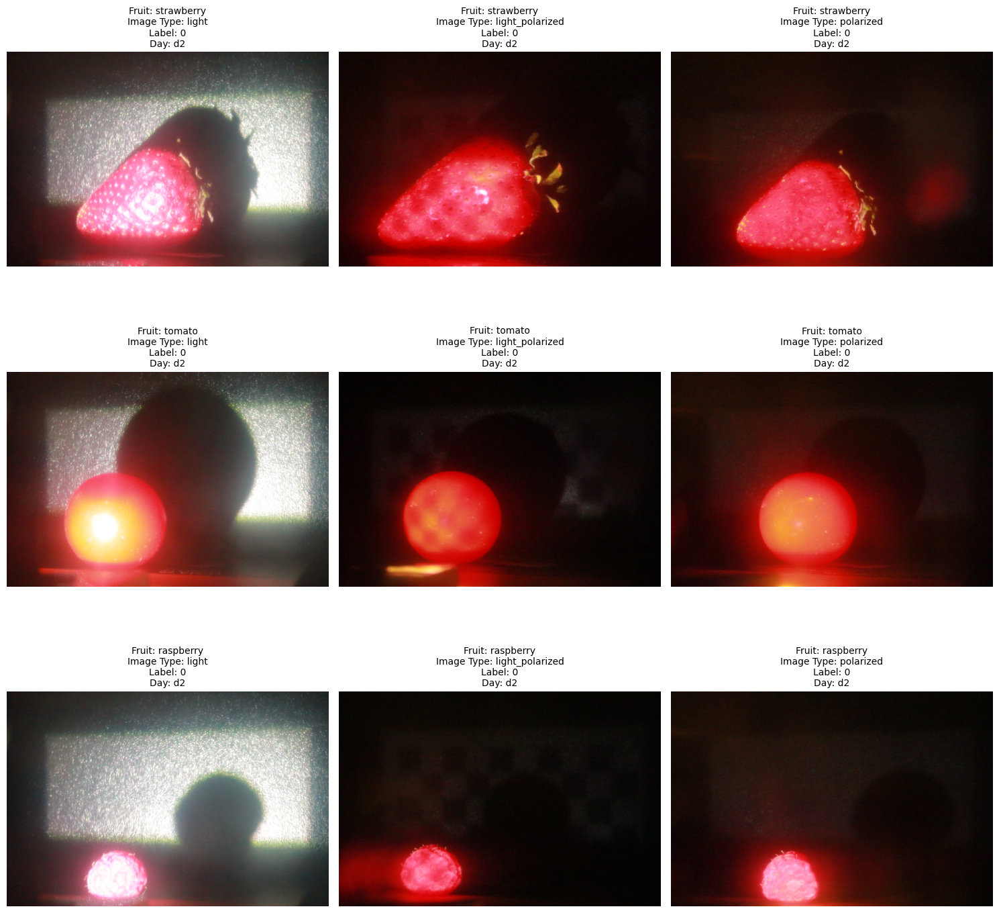

In [42]:
visualize_images_v3(all_data, fruitTypes=['strawberry', 'tomato', 'raspberry'], imageTypes=[0, 1, 2], fruitLabels=[0], days=['d2'], max_images=9, base_path='./')

## **DATA PREPARATION**

In [43]:
all_data

,imgID,fruitType,imageType,fruitLabel,day
0,3540,strawberry,0,0,d1
1,3541,strawberry,0,0,d1
2,3542,strawberry,0,0,d1
3,3543,strawberry,0,0,d1
4,3544,strawberry,0,0,d1
...,...,...,...,...,...
835,4288,blackberry,2,1,d4
836,4289,blackberry,2,1,d4
837,4290,blackberry,2,2,d4
838,4291,blackberry,2,2,d4


In [44]:
import os
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models
from PIL import Image
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

class FruitDataset(Dataset):
    def __init__(self, data, base_path, transform=None):
        self.data = data
        self.base_path = base_path
        self.transform = transform
        self.label_encoder = LabelEncoder()
        self.data['encoded_fruitType'] = self.label_encoder.fit_transform(self.data['fruitType'])
        self.fType = self.data['fruitType']
        self.iType = self.data['imageType']
        self.dType = self.data['day']

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        
        # Load the image
        image_type_folder = {0: "light", 1: "light_polarized", 2: "polarized"}
        image_path = os.path.join(self.base_path, row['day'], image_type_folder[row['imageType']], f"IMG_{row['imgID']}.JPG")
        image = Image.open(image_path).convert("RGB")
        fruitType = row['fruitType']
        imageType = row['imageType']
        day = row['day']

        if self.transform:
            image = self.transform(image)

        encoded_fruit_type = row['encoded_fruitType']
        return {
            'image': image,
            'fruitLabel': torch.tensor(row['fruitLabel'], dtype=torch.long),
            'image_path': image_path,
            'fruitType' : fruitType,
            'imageType' : imageType,
        }

def create_dataloader(data, base_path, batch_size=1, shuffle=False, transform=None):
    dataset = FruitDataset(data, base_path, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, num_workers=2, pin_memory=True)
    # dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)
    return dataloader

In [49]:
# Get all data
all_data = select_images_v4('./')

# Define image transformations for data augmentation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Split the data into training and testing sets with an 80-20 split and shuffle the data
train_data, test_data = train_test_split(all_data, test_size=0.2, random_state=42, shuffle=True)

# Create dataloaders with a batch size of 4
# base_path = '/content/drive/MyDrive/16823 - Physics-Based Methods in Vision/all_fruits/fruit'
base_path = './'
# train_dataloader = create_dataloader(train_data, base_path, batch_size=16, shuffle=True, transform=transform)
# test_dataloader = create_dataloader(test_data, base_path, batch_size=4, shuffle=True, transform=transform)

# Create dataloaders for training and validation
train_dataset = FruitDataset(train_data, base_path, transform=transform)
test_dataset = FruitDataset(test_data, base_path, transform=transform)

#
total_len = len(train_data)
train_len = int(total_len * 0.8)
val_len = total_len - train_len

# train_dataloader = create_dataloader(train_data, base_path, batch_size=4, transform=transform)
# test_dataloader = create_dataloader(test_data, base_path, batch_size=4, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)
train_loader, val_loader = random_split(train_dataset, [train_len, val_len])
dataloaders = {'train': DataLoader(train_loader, batch_size=16, shuffle=True, num_workers=2, pin_memory=True),
                'val': DataLoader(val_loader, batch_size=4, shuffle=False, num_workers=2, pin_memory=True)}

In [50]:
print(total_len, train_len, val_len, len(test_data))

672 537 135 168


## **MODEL TRAINING**

In [47]:
# Initialize the ResNet-18 model
model = models.resnet18(weights=True)
model.to('cuda')
# Freeze all layers except the last one
for param in model.parameters():
    param.requires_grad = False

# Replace the last fully connected layer to match the number of classes in your dataset
num_features = model.fc.in_features
num_classes = len(torch.unique(torch.tensor(all_data['fruitLabel'])))
model.fc = nn.Linear(num_features, num_classes)

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 189MB/s]


In [48]:
from tqdm import tqdm
import os
import copy

def train_model(model, dataloaders, criterion, optimizer, scheduler, device='cuda', num_epochs=5):
    model.to(device)
    best_val_loss = float('inf')
    best_model_weights = copy.deepcopy(model.state_dict())

    for epoch in tqdm(range(num_epochs)):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
                dataloader = dataloaders['train']
            else:
                model.eval()   # Set model to evaluate mode
                dataloader = dataloaders['val']
                # import pdb;pdb.set_trace()

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for batch in dataloader:
                # print(batch['image'].shape)
                inputs = batch['image'].to(device) # torch.Size([16, 3, 224, 224])
                labels = batch['fruitLabel'].to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward
                # import pdb;pdb.set_trace()
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # Backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)  # Update the number of correct predictions


            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / len(dataloader.dataset)
            epoch_acc = running_corrects.double() / len(dataloader.dataset)  # Calculate accuracy
            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')  # Print accuracy


            # Save model weights if validation loss has improved
            if phase == 'val' and epoch_loss < best_val_loss:
                best_val_loss = epoch_loss
                best_model_weights = copy.deepcopy(model.state_dict())

        print()

    print('Training complete')

    # Load the best model weights
    model.load_state_dict(best_model_weights)

    return model




In [ ]:
device = 'cuda'

### **BASELINE ALL IMAGES**

In [ ]:
dataloaders['train'].dataset[0]['image'].shape

torch.Size([3, 224, 224])

In [ ]:
dataloaders['val'].dataset[0]['image'].shape

torch.Size([3, 224, 224])

In [ ]:
# Use GPU if available, otherwise use CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Set up the optimizer and learning rate scheduler
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# Train the model
trained_model = train_model(model, dataloaders, criterion, optimizer, scheduler, device, num_epochs=10)

# Save the best model weights
torch.save(trained_model.state_dict(), 'best_model_weights.pth')

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------
train Loss: 0.8199 Acc: 0.6648


 10%|█         | 1/10 [05:47<52:05, 347.32s/it]

val Loss: 0.6568 Acc: 0.6815

Epoch 1/9
----------
train Loss: 0.6794 Acc: 0.7002


 20%|██        | 2/10 [06:26<22:09, 166.23s/it]

val Loss: 0.5751 Acc: 0.7481

Epoch 2/9
----------
train Loss: 0.6328 Acc: 0.7076


 30%|███       | 3/10 [07:09<12:47, 109.63s/it]

val Loss: 0.4960 Acc: 0.7852

Epoch 3/9
----------
train Loss: 0.5949 Acc: 0.7430


 40%|████      | 4/10 [07:49<08:13, 82.19s/it] 

val Loss: 0.5449 Acc: 0.7778

Epoch 4/9
----------
train Loss: 0.5652 Acc: 0.7672


 50%|█████     | 5/10 [08:29<05:36, 67.21s/it]

val Loss: 0.5052 Acc: 0.7778

Epoch 5/9
----------
train Loss: 0.5589 Acc: 0.7356


 60%|██████    | 6/10 [09:09<03:51, 57.95s/it]

val Loss: 0.4487 Acc: 0.8148

Epoch 6/9
----------
train Loss: 0.5299 Acc: 0.7747


 70%|███████   | 7/10 [09:47<02:34, 51.44s/it]

val Loss: 0.4974 Acc: 0.7704

Epoch 7/9
----------
train Loss: 0.5144 Acc: 0.7784


 80%|████████  | 8/10 [10:27<01:35, 47.76s/it]

val Loss: 0.4678 Acc: 0.8074

Epoch 8/9
----------
train Loss: 0.5287 Acc: 0.7691


 90%|█████████ | 9/10 [11:07<00:45, 45.36s/it]

val Loss: 0.4739 Acc: 0.8074

Epoch 9/9
----------
train Loss: 0.5118 Acc: 0.7989


100%|██████████| 10/10 [11:50<00:00, 71.01s/it]

val Loss: 0.4805 Acc: 0.7926

Training complete


#### **DATA AUGMENTATION**

In [ ]:
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=2),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


train_dataset = FruitDataset(train_data, base_path, transform=train_transform)
test_dataset = FruitDataset(test_data, base_path, transform=test_transform)

train_loader, val_loader = random_split(train_dataset, [train_len, val_len])
dataloaders = {'train': DataLoader(train_loader, batch_size=16, shuffle=True, num_workers=2, pin_memory=True),
                'val': DataLoader(val_loader, batch_size=4, shuffle=False, num_workers=2, pin_memory=True)}

In [ ]:
# Train the model
trained_model_aug = train_model(model, dataloaders, criterion, optimizer, scheduler, device, num_epochs=10)

# Save the best model weights
torch.save(trained_model_aug.state_dict(), 'best_model_aug_weights.pth')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------
train Loss: 0.4808 Acc: 0.8063


 10%|█         | 1/10 [00:50<07:36, 50.74s/it]

val Loss: 0.4549 Acc: 0.8074

Epoch 1/9
----------
train Loss: 0.5155 Acc: 0.7747


 20%|██        | 2/10 [01:37<06:28, 48.53s/it]

val Loss: 0.4252 Acc: 0.8074

Epoch 2/9
----------
train Loss: 0.4933 Acc: 0.7765


 30%|███       | 3/10 [02:24<05:34, 47.74s/it]

val Loss: 0.4781 Acc: 0.8222

Epoch 3/9
----------
train Loss: 0.5155 Acc: 0.7896


 40%|████      | 4/10 [03:13<04:48, 48.14s/it]

val Loss: 0.5086 Acc: 0.7630

Epoch 4/9
----------
train Loss: 0.4977 Acc: 0.7709


 50%|█████     | 5/10 [03:59<03:58, 47.60s/it]

val Loss: 0.4723 Acc: 0.8000

Epoch 5/9
----------
train Loss: 0.4921 Acc: 0.7896


 60%|██████    | 6/10 [04:50<03:14, 48.59s/it]

val Loss: 0.4818 Acc: 0.7852

Epoch 6/9
----------
train Loss: 0.5177 Acc: 0.7598


 70%|███████   | 7/10 [05:37<02:24, 48.12s/it]

val Loss: 0.4662 Acc: 0.7926

Epoch 7/9
----------
train Loss: 0.5048 Acc: 0.7765


 80%|████████  | 8/10 [06:24<01:35, 47.71s/it]

val Loss: 0.4746 Acc: 0.7852

Epoch 8/9
----------
train Loss: 0.4795 Acc: 0.8045


 90%|█████████ | 9/10 [07:13<00:48, 48.04s/it]

val Loss: 0.4465 Acc: 0.8000

Epoch 9/9
----------
train Loss: 0.4743 Acc: 0.8045


100%|██████████| 10/10 [07:59<00:00, 47.98s/it]

val Loss: 0.4666 Acc: 0.7704

Training complete


#### **FOCAL LOSS**

In [91]:
!pip install pytorch_toolbelt &>/dev/null
from pytorch_toolbelt.losses import FocalLoss, CrossEntropyFocalLoss

In [92]:
criterion_fl = CrossEntropyFocalLoss()

In [ ]:
# Train the model
trained_model_aug_focal = train_model(model, dataloaders, criterion_fl, optimizer, scheduler, device, num_epochs=10)

# Save the best model weights
torch.save(trained_model_aug.state_dict(), 'best_model_aug_focal_weights.pth')

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------
train Loss: 0.2311 Acc: 0.8045


 10%|█         | 1/10 [01:03<09:29, 63.33s/it]

val Loss: 0.1886 Acc: 0.7778

Epoch 1/9
----------
train Loss: 0.2353 Acc: 0.7784


 20%|██        | 2/10 [01:50<07:08, 53.61s/it]

val Loss: 0.2141 Acc: 0.7630

Epoch 2/9
----------
train Loss: 0.2187 Acc: 0.8101


 30%|███       | 3/10 [02:38<05:57, 51.12s/it]

val Loss: 0.2113 Acc: 0.7926

Epoch 3/9
----------
train Loss: 0.2384 Acc: 0.7765


 40%|████      | 4/10 [03:26<05:00, 50.08s/it]

val Loss: 0.2395 Acc: 0.7407

Epoch 4/9
----------
train Loss: 0.2124 Acc: 0.8007


 50%|█████     | 5/10 [04:15<04:08, 49.72s/it]

val Loss: 0.1978 Acc: 0.7926

Epoch 5/9
----------
train Loss: 0.2376 Acc: 0.7747


 60%|██████    | 6/10 [05:04<03:16, 49.21s/it]

val Loss: 0.2264 Acc: 0.7852

Epoch 6/9
----------
train Loss: 0.2276 Acc: 0.7765


 70%|███████   | 7/10 [05:50<02:25, 48.38s/it]

val Loss: 0.2165 Acc: 0.8000

Epoch 7/9
----------
train Loss: 0.2153 Acc: 0.7970


 80%|████████  | 8/10 [06:39<01:36, 48.35s/it]

val Loss: 0.1949 Acc: 0.7926

Epoch 8/9
----------
train Loss: 0.2227 Acc: 0.7858


 90%|█████████ | 9/10 [07:26<00:47, 48.00s/it]

val Loss: 0.2053 Acc: 0.8074

Epoch 9/9
----------
train Loss: 0.2453 Acc: 0.7728


100%|██████████| 10/10 [08:15<00:00, 49.57s/it]

val Loss: 0.2306 Acc: 0.7852

Training complete


### **RESULTS ANALYSIS**

In [52]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Evaluation Function
def evaluate(model, dataloader, device):
    model.eval()
    model.to(device)
    
    all_labels = []
    all_preds = []
    
    with torch.no_grad():
        for batch in dataloader:
            inputs = batch['image'].to(device)
            labels = batch['fruitLabel'].to(device)
            
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
    
    return np.array(all_labels), np.array(all_preds)

def evaluate_v2(model, dataloader, device):
    model.eval()
    model.to(device)
    
    all_labels = []
    all_preds = []
    all_fruit_types = []
    all_image_types = []
    
    with torch.no_grad():
        for batch in dataloader:
            inputs = batch['image'].to(device)
            labels = batch['fruitLabel'].to(device)
            fruit_types = batch['fruitType']
            image_types = batch['imageType']
            
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_fruit_types.extend(fruit_types)
            all_image_types.extend(image_types)
    
    return np.array(all_labels), np.array(all_preds), np.array(all_fruit_types), np.array(all_image_types)


def evaluate_v3(model, dataloader, device):
    model.eval()
    model.to(device)
    
    all_labels = []
    all_preds = []
    all_probs = []
    all_fruit_types = []
    all_image_types = []
    
    with torch.no_grad():
        for batch in dataloader:
            inputs = batch['image'].to(device)
            labels = batch['fruitLabel'].to(device)
            fruit_types = batch['fruitType']
            image_types = batch['imageType']
            
            outputs = model(inputs)
            probs, preds = torch.max(outputs.softmax(dim=1), dim=1)
            
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_fruit_types.extend(fruit_types)
            all_image_types.extend(image_types)
    
    return np.array(all_labels), np.array(all_preds), np.array(all_probs), np.array(all_fruit_types), np.array(all_image_types)

# Create a dictionary to map numeric labels to string labels
label_map = {0: 'Noice', 1: 'So so', 2: 'Nahh'}

#### **BASELINE MODEL**

Confusion Matrix:


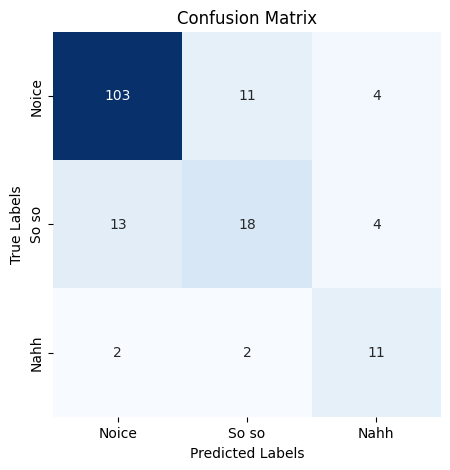

In [ ]:
# Replace the last fully connected layer to match the number of classes in your dataset
trained_model = models.resnet18(weights=None)
num_features = trained_model.fc.in_features
num_classes = len(torch.unique(torch.tensor(all_data['fruitLabel'])))
trained_model.fc = nn.Linear(num_features, num_classes)

# Load weights
trained_model.load_state_dict(torch.load('best_model_weights.pth'))
trained_model.eval()

# Eval
true_labels, predicted_labels = evaluate(trained_model, test_loader, device)
# Convert numeric labels to string labels
true_labels_str = [label_map[label] for label in true_labels]
predicted_labels_str = [label_map[label] for label in predicted_labels]
# Conf
conf_mat = confusion_matrix(true_labels_str, predicted_labels_str, labels=list(label_map.values()))
print("Confusion Matrix:")
# print(conf_mat)
# Visualize the confusion matrix using a heatmap
plt.figure(figsize=(5, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_map.values(), yticklabels=label_map.values())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#### **AUGMENTED FOCAL LOSS MODEL**

Confusion Matrix:


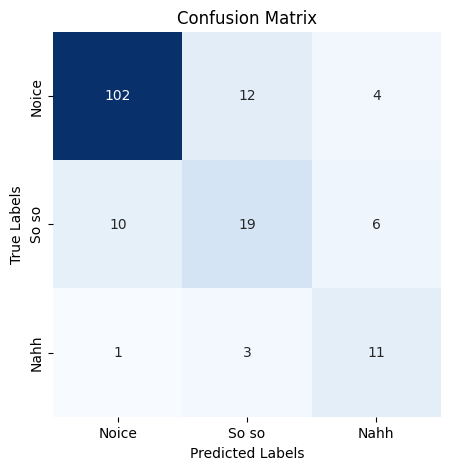

In [ ]:
# Replace the last fully connected layer to match the number of classes in your dataset
trained_model_aug = models.resnet18(weights=None)
num_features = trained_model_aug.fc.in_features
num_classes = len(torch.unique(torch.tensor(all_data['fruitLabel'])))
trained_model_aug.fc = nn.Linear(num_features, num_classes)

# Load weights
trained_model_aug.load_state_dict(torch.load('best_model_aug_weights.pth'))
trained_model_aug.eval()

# Eval
true_labels, predicted_labels = evaluate(trained_model_aug, test_loader, device)
# Convert numeric labels to string labels
true_labels_str = [label_map[label] for label in true_labels]
predicted_labels_str = [label_map[label] for label in predicted_labels]
# Conf
conf_mat = confusion_matrix(true_labels_str, predicted_labels_str, labels=list(label_map.values()))
print("Confusion Matrix:")
# print(conf_mat)
# Visualize the confusion matrix using a heatmap
plt.figure(figsize=(5, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_map.values(), yticklabels=label_map.values())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#### **FOCAL LOSS MODEL**

Confusion Matrix:


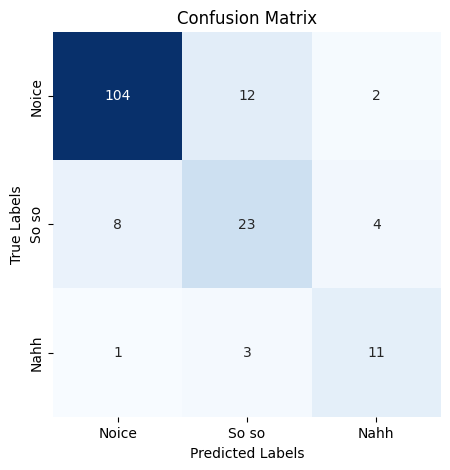

In [ ]:
# Replace the last fully connected layer to match the number of classes in your dataset
trained_model_aug_focal = models.resnet18(weights=None)
num_features = trained_model_aug_focal.fc.in_features
num_classes = len(torch.unique(torch.tensor(all_data['fruitLabel'])))
trained_model_aug_focal.fc = nn.Linear(num_features, num_classes)

# Load weights
trained_model_aug_focal.load_state_dict(torch.load('best_model_aug_focal_weights.pth'))
trained_model_aug_focal.eval()

true_labels, predicted_labels = evaluate(trained_model_aug_focal, test_loader, device)
# Convert numeric labels to string labels
true_labels_str = [label_map[label] for label in true_labels]
predicted_labels_str = [label_map[label] for label in predicted_labels]
# Conf
conf_mat = confusion_matrix(true_labels_str, predicted_labels_str, labels=list(label_map.values()))
print("Confusion Matrix:")
# print(conf_mat)
# Visualize the confusion matrix using a heatmap
plt.figure(figsize=(5, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_map.values(), yticklabels=label_map.values())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

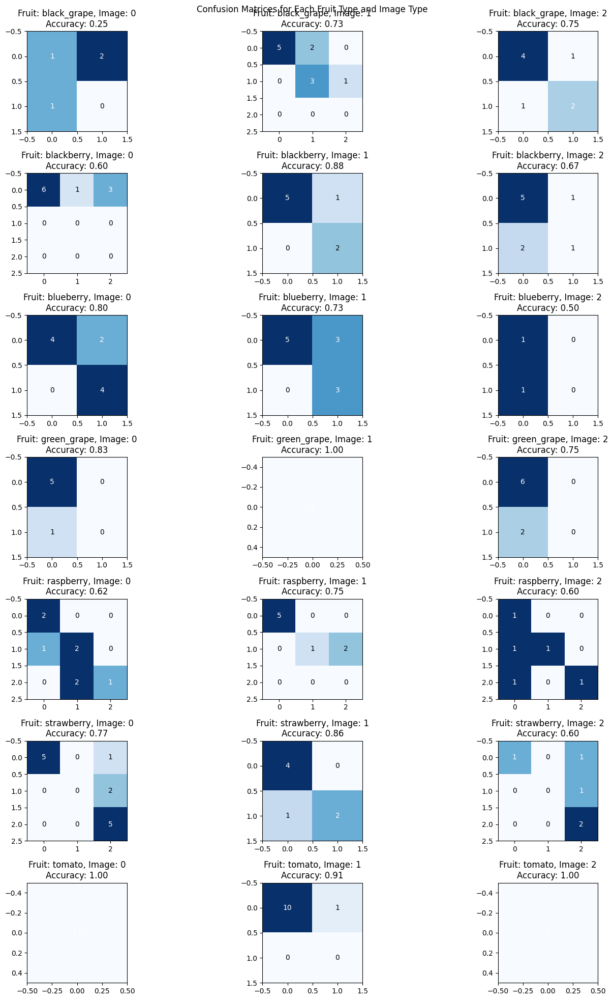

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score

# Replace the last fully connected layer to match the number of classes in your dataset
trained_model_aug_focal = models.resnet18(weights=None)
num_features = trained_model_aug_focal.fc.in_features
num_classes = len(torch.unique(torch.tensor(all_data['fruitLabel'])))
trained_model_aug_focal.fc = nn.Linear(num_features, num_classes)

# Load weights
trained_model_aug_focal.load_state_dict(torch.load('best_model_aug_focal_weights.pth'))
trained_model_aug_focal.eval()

# Evaluate the model on the test dataset
true_labels, predicted_labels, predicted_probs, fruit_types, image_types = evaluate_v3(trained_model_aug_focal, test_loader, device)

# Get unique fruit types and image types
unique_fruit_types = np.unique(fruit_types)
unique_image_types = np.unique(image_types)

# Create subplots for each combination of fruit type and image type
fig, axs = plt.subplots(len(unique_fruit_types), len(unique_image_types), figsize=(15, 20))
fig.suptitle('Confusion Matrices for Each Fruit Type and Image Type')

# Loop through each fruit type and image type
for i, fruit_type in enumerate(unique_fruit_types):
    for j, image_type in enumerate(unique_image_types):
        # Filter labels and predictions based on fruit type and image type
        mask = (fruit_types == fruit_type) & (image_types == image_type)
        filtered_true_labels = true_labels[mask]
        filtered_predicted_labels = predicted_labels[mask]

        # Calculate the confusion matrix for this fruit type and image type
        conf_mat = confusion_matrix(filtered_true_labels, filtered_predicted_labels)

        # Calculate the accuracy for this fruit type and image type
        acc = accuracy_score(filtered_true_labels, filtered_predicted_labels)

        # Display the confusion matrix in the corresponding subplot
        ax = axs[i, j]
        ax.imshow(conf_mat, cmap='Blues')
        ax.set_title(f'Fruit: {fruit_type}, Image: {image_type}\nAccuracy: {acc:.2f}')

        # Add prediction counts as text annotations on each grid
        for x in range(conf_mat.shape[0]):
            for y in range(conf_mat.shape[1]):
                count = conf_mat[x, y]
                ax.text(y, x, str(count), ha='center', va='center', color='black' if count < conf_mat.max() / 2 else 'white')

plt.tight_layout()
plt.show()

#### **STRUCTURED LIGHT - AUGMENTED FOCAL LOSS**

In [93]:
# Split the data into training and testing sets with an 80-20 split and shuffle the data
base_path = './'
all_data = select_images_v4(base_path, days=None, fruit_types=None, image_types=[0], fruit_labels=None)
train_data, test_data = train_test_split(all_data, test_size=0.2, random_state=42, shuffle=True)

# Create dataloaders with a batch size of 4
# base_path = '/content/drive/MyDrive/16823 - Physics-Based Methods in Vision/all_fruits/fruit'
# train_dataloader = create_dataloader(train_data, base_path, batch_size=16, shuffle=True, transform=transform)
# test_dataloader = create_dataloader(test_data, base_path, batch_size=4, shuffle=True, transform=transform)

# Create dataloaders for training and validation
train_dataset = FruitDataset(train_data, base_path, transform=transform)
test_dataset = FruitDataset(test_data, base_path, transform=transform)

#
total_len = len(train_data)
train_len = int(total_len * 0.8)
val_len = total_len - train_len

# train_dataloader = create_dataloader(train_data, base_path, batch_size=4, transform=transform)
# test_dataloader = create_dataloader(test_data, base_path, batch_size=4, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)
train_loader, val_loader = random_split(train_dataset, [train_len, val_len])
dataloaders = {'train': DataLoader(train_loader, batch_size=16, shuffle=True, num_workers=2, pin_memory=True),
                'val': DataLoader(val_loader, batch_size=4, shuffle=False, num_workers=2, pin_memory=True)}

In [94]:
all_data.keys()

Index(['imgID', 'fruitType', 'imageType', 'fruitLabel', 'day'], dtype='object')

In [95]:
# Train the model
trained_model_aug_focal_structured = train_model(model, dataloaders, criterion_fl, optimizer, scheduler, device, num_epochs=10)

# Save the best model weights
torch.save(trained_model_aug.state_dict(), 'best_model_aug_focal_structured_weights.pth')

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------
train Loss: 0.2244 Acc: 0.7821


 10%|█         | 1/10 [00:18<02:45, 18.44s/it]

val Loss: 0.1756 Acc: 0.8667

Epoch 1/9
----------
train Loss: 0.2305 Acc: 0.7486


 20%|██        | 2/10 [00:42<02:54, 21.87s/it]

val Loss: 0.1340 Acc: 0.8667

Epoch 2/9
----------
train Loss: 0.1977 Acc: 0.7765


 30%|███       | 3/10 [00:57<02:10, 18.62s/it]

val Loss: 0.1865 Acc: 0.8222

Epoch 3/9
----------
train Loss: 0.2136 Acc: 0.7654


 40%|████      | 4/10 [01:17<01:55, 19.25s/it]

val Loss: 0.1876 Acc: 0.7556

Epoch 4/9
----------
train Loss: 0.2105 Acc: 0.7877


 50%|█████     | 5/10 [01:35<01:34, 18.87s/it]

val Loss: 0.1751 Acc: 0.9111

Epoch 5/9
----------
train Loss: 0.2015 Acc: 0.7821


 60%|██████    | 6/10 [01:50<01:10, 17.52s/it]

val Loss: 0.1781 Acc: 0.8222

Epoch 6/9
----------
train Loss: 0.2194 Acc: 0.7877


 70%|███████   | 7/10 [02:05<00:49, 16.45s/it]

val Loss: 0.1435 Acc: 0.8667

Epoch 7/9
----------
train Loss: 0.2188 Acc: 0.7374


 80%|████████  | 8/10 [02:19<00:31, 15.96s/it]

val Loss: 0.1375 Acc: 0.8667

Epoch 8/9
----------
train Loss: 0.2163 Acc: 0.7486


 90%|█████████ | 9/10 [02:34<00:15, 15.41s/it]

val Loss: 0.1106 Acc: 0.8889

Epoch 9/9
----------
train Loss: 0.2144 Acc: 0.7486


100%|██████████| 10/10 [02:48<00:00, 16.83s/it]

val Loss: 0.1704 Acc: 0.8222

Training complete


#### **STRUCTURED POLARIZED LIGHT - AUGMENTED FOCAL LOSS**

In [96]:
# Split the data into training and testing sets with an 80-20 split and shuffle the data
base_path = './'
all_data = select_images_v4(base_path, days=None, fruit_types=None, image_types=[1], fruit_labels=None)
train_data, test_data = train_test_split(all_data, test_size=0.2, random_state=42, shuffle=True)

# Create dataloaders with a batch size of 4
# base_path = '/content/drive/MyDrive/16823 - Physics-Based Methods in Vision/all_fruits/fruit'
# train_dataloader = create_dataloader(train_data, base_path, batch_size=16, shuffle=True, transform=transform)
# test_dataloader = create_dataloader(test_data, base_path, batch_size=4, shuffle=True, transform=transform)

# Create dataloaders for training and validation
train_dataset = FruitDataset(train_data, base_path, transform=transform)
test_dataset = FruitDataset(test_data, base_path, transform=transform)

#
total_len = len(train_data)
train_len = int(total_len * 0.8)
val_len = total_len - train_len

# train_dataloader = create_dataloader(train_data, base_path, batch_size=4, transform=transform)
# test_dataloader = create_dataloader(test_data, base_path, batch_size=4, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)
train_loader, val_loader = random_split(train_dataset, [train_len, val_len])
dataloaders = {'train': DataLoader(train_loader, batch_size=16, shuffle=True, num_workers=2, pin_memory=True),
                'val': DataLoader(val_loader, batch_size=4, shuffle=False, num_workers=2, pin_memory=True)}

In [97]:
# Train the model
trained_model_aug_focal_structured_polarized = train_model(model, dataloaders, criterion_fl, optimizer, scheduler, device, num_epochs=10)

# Save the best model weights
torch.save(trained_model_aug.state_dict(), 'best_model_aug_focal_structured_polarized_weights.pth')

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------
train Loss: 0.2301 Acc: 0.8212


 10%|█         | 1/10 [00:14<02:13, 14.85s/it]

val Loss: 0.1954 Acc: 0.7556

Epoch 1/9
----------
train Loss: 0.2424 Acc: 0.7821


 20%|██        | 2/10 [00:28<01:53, 14.16s/it]

val Loss: 0.2351 Acc: 0.7333

Epoch 2/9
----------
train Loss: 0.2018 Acc: 0.7933


 30%|███       | 3/10 [00:42<01:39, 14.25s/it]

val Loss: 0.2404 Acc: 0.7778

Epoch 3/9
----------
train Loss: 0.2208 Acc: 0.7765


 40%|████      | 4/10 [00:56<01:24, 14.01s/it]

val Loss: 0.2189 Acc: 0.7778

Epoch 4/9
----------
train Loss: 0.2182 Acc: 0.8101


 50%|█████     | 5/10 [01:10<01:09, 13.86s/it]

val Loss: 0.3113 Acc: 0.7111

Epoch 5/9
----------
train Loss: 0.1793 Acc: 0.7989


 60%|██████    | 6/10 [01:23<00:54, 13.74s/it]

val Loss: 0.2361 Acc: 0.7111

Epoch 6/9
----------
train Loss: 0.2220 Acc: 0.7933


 70%|███████   | 7/10 [01:37<00:41, 13.92s/it]

val Loss: 0.2735 Acc: 0.7333

Epoch 7/9
----------
train Loss: 0.2726 Acc: 0.7933


 80%|████████  | 8/10 [01:51<00:27, 13.84s/it]

val Loss: 0.2424 Acc: 0.7333

Epoch 8/9
----------
train Loss: 0.2087 Acc: 0.7821


 90%|█████████ | 9/10 [02:04<00:13, 13.69s/it]

val Loss: 0.3040 Acc: 0.6667

Epoch 9/9
----------
train Loss: 0.2188 Acc: 0.7821


100%|██████████| 10/10 [02:18<00:00, 13.83s/it]

val Loss: 0.2693 Acc: 0.7333

Training complete


#### **POLARIZED - AUGMENTED FOCAL LOSS**

In [98]:
# Split the data into training and testing sets with an 80-20 split and shuffle the data
base_path = './'
all_data = select_images_v4(base_path, days=None, fruit_types=None, image_types=[2], fruit_labels=None)
train_data, test_data = train_test_split(all_data, test_size=0.2, random_state=42, shuffle=True)

# Create dataloaders with a batch size of 4
# base_path = '/content/drive/MyDrive/16823 - Physics-Based Methods in Vision/all_fruits/fruit'
# train_dataloader = create_dataloader(train_data, base_path, batch_size=16, shuffle=True, transform=transform)
# test_dataloader = create_dataloader(test_data, base_path, batch_size=4, shuffle=True, transform=transform)

# Create dataloaders for training and validation
train_dataset = FruitDataset(train_data, base_path, transform=transform)
test_dataset = FruitDataset(test_data, base_path, transform=transform)

#
total_len = len(train_data)
train_len = int(total_len * 0.8)
val_len = total_len - train_len

# train_dataloader = create_dataloader(train_data, base_path, batch_size=4, transform=transform)
# test_dataloader = create_dataloader(test_data, base_path, batch_size=4, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)
train_loader, val_loader = random_split(train_dataset, [train_len, val_len])
dataloaders = {'train': DataLoader(train_loader, batch_size=16, shuffle=True, num_workers=2, pin_memory=True),
                'val': DataLoader(val_loader, batch_size=4, shuffle=False, num_workers=2, pin_memory=True)}

In [99]:
# Train the model
trained_model_aug_focal_polarized = train_model(model, dataloaders, criterion_fl, optimizer, scheduler, device, num_epochs=10)

# Save the best model weights
torch.save(trained_model_aug.state_dict(), 'best_model_aug_focal_polarized_weights.pth')

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------
train Loss: 0.2640 Acc: 0.7318


 10%|█         | 1/10 [00:15<02:22, 15.82s/it]

val Loss: 0.2123 Acc: 0.6889

Epoch 1/9
----------
train Loss: 0.2710 Acc: 0.7598


 20%|██        | 2/10 [00:29<01:55, 14.40s/it]

val Loss: 0.2983 Acc: 0.7778

Epoch 2/9
----------
train Loss: 0.2618 Acc: 0.6872


 30%|███       | 3/10 [00:42<01:37, 13.96s/it]

val Loss: 0.2155 Acc: 0.7111

Epoch 3/9
----------
train Loss: 0.3100 Acc: 0.7095


 40%|████      | 4/10 [00:56<01:22, 13.77s/it]

val Loss: 0.2960 Acc: 0.7778

Epoch 4/9
----------
train Loss: 0.2623 Acc: 0.7318


 50%|█████     | 5/10 [01:09<01:08, 13.67s/it]

val Loss: 0.2912 Acc: 0.7556

Epoch 5/9
----------
train Loss: 0.2587 Acc: 0.7207


 60%|██████    | 6/10 [01:22<00:54, 13.53s/it]

val Loss: 0.3111 Acc: 0.7778

Epoch 6/9
----------
train Loss: 0.2454 Acc: 0.7598


 70%|███████   | 7/10 [01:35<00:39, 13.31s/it]

val Loss: 0.2347 Acc: 0.7333

Epoch 7/9
----------
train Loss: 0.2625 Acc: 0.7318


 80%|████████  | 8/10 [01:48<00:26, 13.20s/it]

val Loss: 0.3455 Acc: 0.7111

Epoch 8/9
----------
train Loss: 0.2643 Acc: 0.7095


 90%|█████████ | 9/10 [02:02<00:13, 13.23s/it]

val Loss: 0.2674 Acc: 0.7556

Epoch 9/9
----------
train Loss: 0.2930 Acc: 0.7486


100%|██████████| 10/10 [02:15<00:00, 13.57s/it]

val Loss: 0.2619 Acc: 0.6889

Training complete


#### **OUT OF SAMPLE TEST - AUGMENTED FOCAL LOSS**

In [107]:
# Test on data that are collected with other imageType
base_path = './'
test_data = select_images_v4(base_path, days=None, fruit_types=None, image_types=[1, 2], fruit_labels=None)

# Create dataloaders for testing
test_dataset = FruitDataset(test_data, base_path, transform=transform)
test_loader_1 = DataLoader(test_dataset, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)

Confusion Matrix:


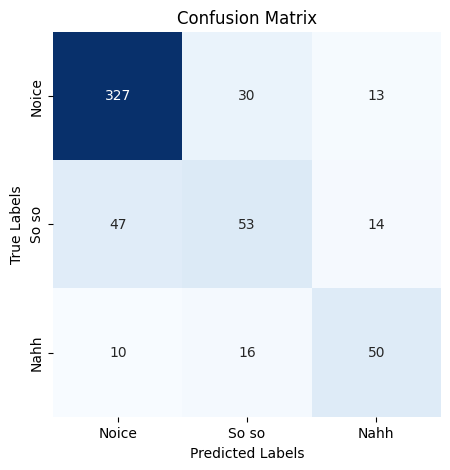

In [110]:
# Replace the last fully connected layer to match the number of classes in your dataset
trained_model_aug_focal_structured = models.resnet18(weights=None)
num_features = trained_model_aug_focal_structured.fc.in_features
num_classes = 3 #len(torch.unique(torch.tensor(test_data['fruitLabel'])))
trained_model_aug_focal_structured.fc = nn.Linear(num_features, num_classes)

# Load weights
trained_model_aug_focal_structured.load_state_dict(torch.load('best_model_aug_focal_structured_weights.pth'))
trained_model_aug_focal_structured.eval()

true_labels, predicted_labels = evaluate(trained_model_aug_focal_structured, test_loader_1, device)
# Convert numeric labels to string labels
true_labels_str = [label_map[label] for label in true_labels]
predicted_labels_str = [label_map[label] for label in predicted_labels]
# Conf
conf_mat = confusion_matrix(true_labels_str, predicted_labels_str, labels=list(label_map.values()))
print("Confusion Matrix:")
# print(conf_mat)
# Visualize the confusion matrix using a heatmap
plt.figure(figsize=(5, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_map.values(), yticklabels=label_map.values())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [111]:
# Test on data that are collected with other imageType
base_path = './'
test_data = select_images_v4(base_path, days=None, fruit_types=None, image_types=[0, 2], fruit_labels=None)

# Create dataloaders for testing
test_dataset = FruitDataset(test_data, base_path, transform=transform)
test_loader_2 = DataLoader(test_dataset, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)

Confusion Matrix:


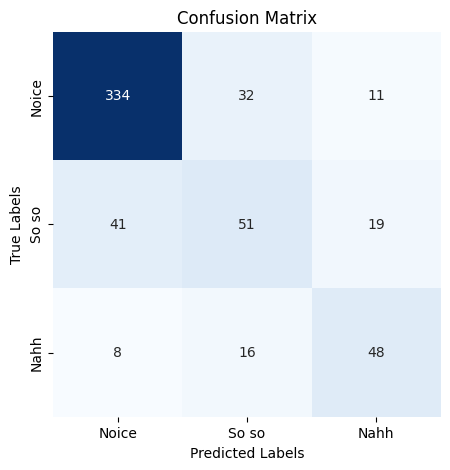

In [112]:
# Replace the last fully connected layer to match the number of classes in your dataset
trained_model_aug_focal_structured_polarized = models.resnet18(weights=None)
num_features = trained_model_aug_focal_structured_polarized.fc.in_features
num_classes = 3 #len(torch.unique(torch.tensor(all_data['fruitLabel'])))
trained_model_aug_focal_structured_polarized.fc = nn.Linear(num_features, num_classes)

# Load weights
trained_model_aug_focal_structured_polarized.load_state_dict(torch.load('best_model_aug_focal_structured_polarized_weights.pth'))
trained_model_aug_focal_structured_polarized.eval()

true_labels, predicted_labels = evaluate(trained_model_aug_focal_structured_polarized, test_loader_2, device)
# Convert numeric labels to string labels
true_labels_str = [label_map[label] for label in true_labels]
predicted_labels_str = [label_map[label] for label in predicted_labels]
# Conf
conf_mat = confusion_matrix(true_labels_str, predicted_labels_str, labels=list(label_map.values()))
print("Confusion Matrix:")
# print(conf_mat)
# Visualize the confusion matrix using a heatmap
plt.figure(figsize=(5, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_map.values(), yticklabels=label_map.values())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [122]:
# Test on data that are collected with other imageType
base_path = './'
test_data = select_images_v4(base_path, days=None, fruit_types=None, image_types=[0, 1], fruit_labels=None)

# Create dataloaders for testing
test_dataset = FruitDataset(test_data, base_path, transform=transform)
test_loader_3 = DataLoader(test_dataset, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)

Confusion Matrix:


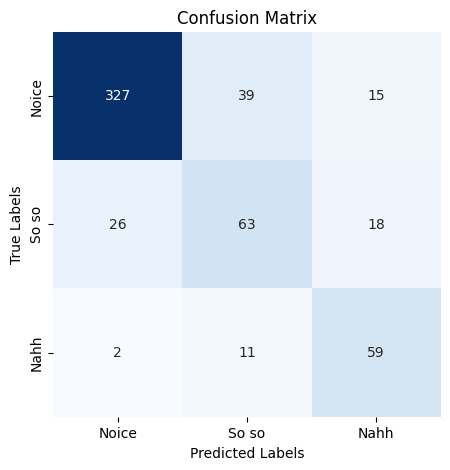

In [123]:
# Replace the last fully connected layer to match the number of classes in your dataset
trained_model_aug_focal_polarized = models.resnet18(weights=None)
num_features = trained_model_aug_focal_polarized.fc.in_features
num_classes = 3 #len(torch.unique(torch.tensor(all_data['fruitLabel'])))
trained_model_aug_focal_polarized.fc = nn.Linear(num_features, num_classes)

# Load weights
trained_model_aug_focal_polarized.load_state_dict(torch.load('best_model_aug_focal_polarized_weights.pth'))
trained_model_aug_focal_polarized.eval()

true_labels, predicted_labels = evaluate(trained_model_aug_focal_polarized, test_loader_3, device)
# Convert numeric labels to string labels
true_labels_str = [label_map[label] for label in true_labels]
predicted_labels_str = [label_map[label] for label in predicted_labels]
# Conf
conf_mat = confusion_matrix(true_labels_str, predicted_labels_str, labels=list(label_map.values()))
print("Confusion Matrix:")
# print(conf_mat)
# Visualize the confusion matrix using a heatmap
plt.figure(figsize=(5, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_map.values(), yticklabels=label_map.values())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#### **FRUIT PERFORMANCE - AUGMENTED FOCAL LOSS**

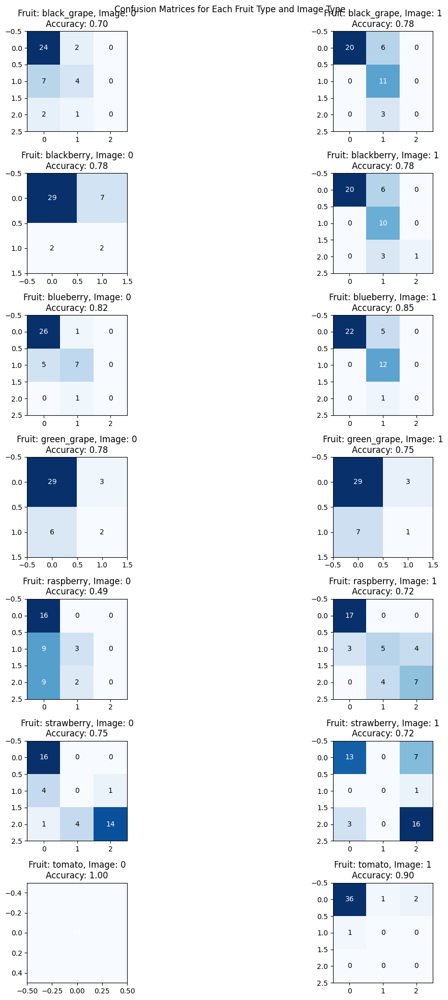

In [138]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score

# Evaluate the model on the test dataset
true_labels, predicted_labels, predicted_probs, fruit_types, image_types = evaluate_v3(model, test_loader, device)

# Get unique fruit types and image types
unique_fruit_types = np.unique(fruit_types)
unique_image_types = np.unique(image_types)

# # Display accuracy and confusion matrix by fruitType
# for fruit_type in unique_fruit_types:
#     # Filter labels, predictions, and probabilities based on fruit type
#     mask = fruit_types == fruit_type
#     filtered_true_labels = true_labels[mask]
#     filtered_predicted_labels = predicted_labels[mask]
#     filtered_predicted_probs = predicted_probs[mask]
    
#     # Calculate the confusion matrix
#     conf_mat = confusion_matrix(filtered_true_labels, filtered_predicted_labels)
    
#     # Calculate accuracy
#     accuracy = accuracy_score(filtered_true_labels, filtered_predicted_labels)
    
#     # Display the confusion matrix and accuracy
#     plt.figure()
#     plt.imshow(conf_mat, cmap='Blues')
#     plt.title(f'Confusion Matrix for Fruit Type: {fruit_type}\nAccuracy: {accuracy:.2f}')
#     plt.colorbar()
#     plt.show()
    
#     # Find the example with the lowest confidence
#     min_prob_idx = np.argmin(filtered_predicted_probs)
#     min_prob_img = test_dataset[min_prob_idx] #.cpu()
#     min_prob_label = filtered_true_labels[min_prob_idx]
#     min_prob_pred = filtered_predicted_labels[min_prob_idx]
#     min_prob_prob = filtered_predicted_probs[min_prob_idx]
    
#     # Display the example with the lowest confidence
#     plt.figure()
#     plt.imshow(min_prob_img.permute(1, 2, 0))
#     plt.title(f'Lowest Confidence Example\nTrue Label: {min_prob_label}, Predicted Label: {min_prob_pred}, Confidence: {min_prob_prob:.2f}')
#     plt.axis('off')
#     plt.show()

# Create subplots for each combination of fruit type and image type
fig, axs = plt.subplots(len(unique_fruit_types), len(unique_image_types), figsize=(15, 20))
fig.suptitle('Confusion Matrices for Each Fruit Type and Image Type')

# Loop through each fruit type and image type
for i, fruit_type in enumerate(unique_fruit_types):
    for j, image_type in enumerate(unique_image_types):
        # Filter labels and predictions based on fruit type and image type
        mask = (fruit_types == fruit_type) & (image_types == image_type)
        filtered_true_labels = true_labels[mask]
        filtered_predicted_labels = predicted_labels[mask]

        # Calculate the confusion matrix for this fruit type and image type
        conf_mat = confusion_matrix(filtered_true_labels, filtered_predicted_labels)

        # Calculate the accuracy for this fruit type and image type
        acc = accuracy_score(filtered_true_labels, filtered_predicted_labels)

        # Display the confusion matrix in the corresponding subplot
        ax = axs[i, j]
        ax.imshow(conf_mat, cmap='Blues')
        ax.set_title(f'Fruit: {fruit_type}, Image: {image_type}\nAccuracy: {acc:.2f}')

        # Add prediction counts as text annotations on each grid
        for x in range(conf_mat.shape[0]):
            for y in range(conf_mat.shape[1]):
                count = conf_mat[x, y]
                ax.text(y, x, str(count), ha='center', va='center', color='black' if count < conf_mat.max() / 2 else 'white')

plt.tight_layout()
plt.show()

## **REFERENCES**